# Self-Supervised Colorization with Stacked Denoising Autoencoder on ImageNet-1K

This notebook trains a *self-supervised* colorization model on ImageNet-1K (ILSVRC 2012) using a **stacked denoising autoencoder (U-Net style)**.

- Input: Noisy grayscale (L channel of Lab)
- Target: Color channels (a, b of Lab)
- Dataset: `ILSVRC2012_img_train` (tar files, one tar per class)
- Training is *self-supervised*: we only use raw images, no labels.

Key features:
- Adjustable **subset_fraction** to train on a fraction of the dataset.
- **Stratified sampling** across classes: each class contributes roughly the same fraction.
- Clean PyTorch implementation with training / validation loops and visualization.

In [1]:
import os
import random
import math
from pathlib import Path
from collections import defaultdict

import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision.datasets import ImageFolder
from torchvision import transforms

import cv2
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
class Config:
    # Dataset: use Stable ImageNet-1K only
    USE_EXISTING_EXTRACTED = True
    EXISTING_EXTRACTED_ROOT = Path("/kaggle/input/stable-imagenet1k")
    RUN_EXTRACTION = False

    # Subset / validation fractions
    SUBSET_FRACTION = 1.0      # use all images
    VAL_FRACTION = 0.1

    # Randomness control
    RANDOM_SEED = 42

    # Dataset noise (used by ImageNetColorizationDataset)
    NOISE_STD = 0.0

    # Training params
    BATCH_SIZE = 64
    IMAGE_SIZE = 256
    LR = 1e-4
    WEIGHT_DECAY = 1e-4
    USE_AMP = True

    # DataLoader params (missing → causing your error)
    NUM_WORKERS = 4
    PIN_MEMORY = True
    NUM_EPOCHS = 50

    # Device
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    # Logging / checkpointing
    CHECKPOINT_DIR = Path("/kaggle/working/checkpoints")
    CHECKPOINT_DIR2 = Path("/kaggle/input/model1")
    CKPT_NAME = "colorization_sdae_unet_best.pth"
    LOG_EVERY_N_STEPS = 100

cfg = Config()
CHECKPOINT_DIR = Path("/kaggle/working/checkpoints")

In [4]:
cfg.CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)

In [5]:
# --- START: Stable ImageNet-1K dataset override ---
# This cell was inserted automatically to point the notebook to the
# Stable ImageNet-1K Kaggle dataset. Adjust the path below if needed.

from pathlib import Path

# If you mounted the Kaggle dataset, the usual path is:
_cand = Path("/kaggle/input/stable-imagenet1k/imagenet1k")

def find_class_root(candidate_root: Path, min_classes=100, max_classes=1200):
    """Return a Path that looks like the dataset root containing class subfolders."""
    candidate_root = Path(candidate_root)
    if not candidate_root.exists():
        return None
    # If the root itself looks like class-folder root (contains many subdirs), use it
    subdirs = [p for p in candidate_root.iterdir() if p.is_dir()]
    if min_classes <= len(subdirs) <= max_classes:
        return candidate_root
    # else check one level down
    for sub in subdirs:
        sub_subdirs = [p for p in sub.iterdir() if p.is_dir()] if sub.exists() else []
        if min_classes <= len(sub_subdirs) <= max_classes:
            return sub
    return None

root_found = find_class_root(_cand, min_classes=100, max_classes=1200)

if root_found is not None:
    print("Auto-detected Stable ImageNet-1K root at:", root_found)
    cfg.USE_EXISTING_EXTRACTED = True
    cfg.EXISTING_EXTRACTED_ROOT = Path(root_found)
    cfg.RUN_EXTRACTION = False
else:
    # Fallback: set to the expected Kaggle mount path (update if your path is different)
    print("Auto-detect failed — using default Kaggle input path (update if needed):", _cand)
    cfg.USE_EXISTING_EXTRACTED = True
    cfg.EXISTING_EXTRACTED_ROOT = _cand
    cfg.RUN_EXTRACTION = False

# NOTE: If you want to change subset/val fractions, modify cfg.SUBSET_FRACTION and cfg.VAL_FRACTION below.
# By default the notebook's existing settings will be used.
# Example: to use the full stable dataset uncomment the next line:
# cfg.SUBSET_FRACTION = 1.0
# cfg.VAL_FRACTION = 0.1

# --- END: Stable ImageNet-1K dataset override ---

Auto-detected Stable ImageNet-1K root at: /kaggle/input/stable-imagenet1k/imagenet1k


In [6]:
def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # For full reproducibility (slower)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

set_seed(cfg.RANDOM_SEED)

In [7]:
def build_stratified_imagenet_split(
    root: Path,
    subset_fraction: float,
    val_fraction: float,
    seed: int = 42
):
    """
    Build stratified train/val splits of ImageNet image paths.
    
    - subset_fraction: fraction of images used per class (0 < f <= 1)
    - val_fraction: fraction of that subset used for validation
    """
    assert 0 < subset_fraction <= 1.0
    assert 0 < val_fraction < 1.0
    
    base_ds = ImageFolder(root=str(root))  # uses folder names as class labels
    samples = base_ds.samples  # list of (path, class_idx)
    class_to_idx = base_ds.class_to_idx
    idx_to_class = {v: k for k, v in class_to_idx.items()}
    
    print(f"Total images in extracted dataset: {len(samples)}")
    print(f"Total classes: {len(class_to_idx)}")
    
    by_class = defaultdict(list)
    for path, label in samples:
        by_class[label].append(path)
    
    rng = random.Random(seed)
    
    train_samples = []
    val_samples = []
    
    for label, paths in by_class.items():
        paths = list(paths)
        rng.shuffle(paths)
        n_total = len(paths)
        
        n_subset = max(1, int(round(subset_fraction * n_total)))
        subset_paths = paths[:n_subset]
        
        n_val = max(1, int(round(val_fraction * n_subset)))
        val_paths = subset_paths[:n_val]
        train_paths_cls = subset_paths[n_val:]
        
        train_samples.extend((p, label) for p in train_paths_cls)
        val_samples.extend((p, label) for p in val_paths)
    
    rng.shuffle(train_samples)
    rng.shuffle(val_samples)
    
    print(f"Subset fraction per class: {subset_fraction}")
    print(f"Train samples: {len(train_samples)}")
    print(f"Val samples:   {len(val_samples)}")
    
    return train_samples, val_samples, idx_to_class

if cfg.USE_EXISTING_EXTRACTED:
    extracted_root = cfg.EXISTING_EXTRACTED_ROOT
else:
    extracted_root = cfg.EXTRACTED_TRAIN_ROOT

train_samples, val_samples, idx_to_class = build_stratified_imagenet_split(
    root=extracted_root,
    subset_fraction=cfg.SUBSET_FRACTION,
    val_fraction=cfg.VAL_FRACTION,
    seed=cfg.RANDOM_SEED,
)

Total images in extracted dataset: 100001
Total classes: 1000
Subset fraction per class: 1.0
Train samples: 90001
Val samples:   10000


In [8]:
class ImageNetColorizationDataset(Dataset):
    """
    ImageNet colorization dataset using Lab color space.
    
    - Input: noisy L channel (1xHxW, normalized to [-1, 1])
    - Target: ab channels (2xHxW, normalized to [-1, 1])
    - Also returns clean L (for visualizations or future use).
    """
    def __init__(
        self,
        samples,
        image_size: int = 256,
        noise_std: float = 0.1,
        train: bool = True,
    ):
        """
        samples: list of (path, label) pairs
        """
        self.samples = samples
        self.image_size = image_size
        self.noise_std = noise_std
        self.train = train
        
        # Base transforms on PIL Image (before Lab conversion)
        if self.train:
            self.base_transform = transforms.Compose([
                transforms.Resize(int(image_size * 1.1)),
                transforms.RandomResizedCrop(image_size, scale=(0.8, 1.0)),
                transforms.RandomHorizontalFlip(),
            ])
        else:
            self.base_transform = transforms.Compose([
                transforms.Resize(image_size),
                transforms.CenterCrop(image_size),
            ])
    
    def __len__(self):
        return len(self.samples)
    
    @staticmethod
    def _rgb_to_lab(img: np.ndarray):
        """
        img: HxWx3, float32, range [0,1]
        Returns Lab image (same HxWx3) with:
        L: [0, 100], a,b roughly [-128, 127]
        """
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB).astype(np.float32)
        return lab
    
    @staticmethod
    def _lab_normalize(lab: np.ndarray):
        """
        Normalize Lab to:
        L in [-1, 1], a,b in [-1, 1]
        """
        L = lab[..., 0:1]  # [0,100]
        ab = lab[..., 1:]  # ~[-128, 127]
        
        L_norm = (L / 50.0) - 1.0           # 0->-1, 100->+1
        ab_norm = ab / 128.0               # [-128,128] -> [-1,1] approx
        
        return L_norm, ab_norm
    
    def __getitem__(self, idx: int):
        path, label = self.samples[idx]   # label is not used here
        
        with Image.open(path) as img:
            img = img.convert("RGB")
            img = self.base_transform(img)
        
        # Convert to numpy
        rgb = np.asarray(img).astype(np.float32) / 255.0  # [0,1]
        lab = self._rgb_to_lab(rgb)
        L_norm, ab_norm = self._lab_normalize(lab)
        
        # To CHW tensors
        L = torch.from_numpy(L_norm).permute(2, 0, 1).float()  # [1,H,W]
        ab = torch.from_numpy(ab_norm).permute(2, 0, 1).float() # [2,H,W]
        
        # Add Gaussian noise to L
        if self.train and self.noise_std > 0.0:
            noise = torch.randn_like(L) * self.noise_std
            L_noisy = torch.clamp(L + noise, -1.0, 1.0)
        else:
            L_noisy = L.clone()
        
        return L_noisy, ab, L  # input, target, clean_L

In [9]:
train_dataset = ImageNetColorizationDataset(
    samples=train_samples,
    image_size=cfg.IMAGE_SIZE,
    noise_std=cfg.NOISE_STD,
    train=True,
)

val_dataset = ImageNetColorizationDataset(
    samples=val_samples,
    image_size=cfg.IMAGE_SIZE,
    noise_std=0.0,  # no noise for validation visualization
    train=False,
)

train_loader = DataLoader(
    train_dataset,
    batch_size=cfg.BATCH_SIZE,
    shuffle=True,
    num_workers=cfg.NUM_WORKERS,
    pin_memory=cfg.PIN_MEMORY,
    drop_last=True,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=cfg.BATCH_SIZE,
    shuffle=False,
    num_workers=cfg.NUM_WORKERS,
    pin_memory=cfg.PIN_MEMORY,
    drop_last=False,
)

len(train_dataset), len(val_dataset)

(90001, 10000)

In [10]:
# --- START: Verification of dataset counts (Stable ImageNet-1K) ---
# Run this cell after the dataset split/build cell executes.
from torchvision.datasets import ImageFolder
from pathlib import Path
import math

root = Path(cfg.EXISTING_EXTRACTED_ROOT)
print("cfg.EXISTING_EXTRACTED_ROOT ->", root)
if root.exists():
    try:
        base = ImageFolder(root=str(root))
        total_raw = len(base.samples)
        print("Total images found in ImageFolder(root):", total_raw)
        # Show number of class-folders detected (useful for Stable ImageNet-1K)
        classes = base.classes
        print("Number of classes detected by ImageFolder:", len(classes))
    except Exception as e:
        print("Could not instantiate ImageFolder on root:", e)
else:
    print("Dataset root does not exist in this runtime:", root)

# If the notebook created train_dataset / val_dataset variables, print their lengths
try:
    print("len(train_dataset) =", len(train_dataset))
    print("len(val_dataset)   =", len(val_dataset))
    print("BATCH_SIZE =", cfg.BATCH_SIZE)
    print("steps per epoch (ceil) =", math.ceil(len(train_dataset)/cfg.BATCH_SIZE))
except NameError:
    print("train_dataset / val_dataset not defined yet — run the split/build cell first.")
# --- END: Verification ---

cfg.EXISTING_EXTRACTED_ROOT -> /kaggle/input/stable-imagenet1k/imagenet1k
Total images found in ImageFolder(root): 100001
Number of classes detected by ImageFolder: 1000
len(train_dataset) = 90001
len(val_dataset)   = 10000
BATCH_SIZE = 64
steps per epoch (ceil) = 1407


In [11]:
class ConvBlock(nn.Module):
    def __init__(self, in_ch: int, out_ch: int):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )
    
    def forward(self, x):
        return self.block(x)


class UpBlock(nn.Module):
    def __init__(self, in_ch: int, out_ch: int):
        super().__init__()
        # up: in_ch -> out_ch
        self.up = nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2)
        # after concat, channels = out_ch (from up) + out_ch (from skip) = 2*out_ch
        self.conv = ConvBlock(out_ch * 2, out_ch)

    def forward(self, x, skip):
        x = self.up(x)
        # pad if needed (rare at 256x256, but safe)
        if x.shape[-2:] != skip.shape[-2:]:
            diff_y = skip.size(2) - x.size(2)
            diff_x = skip.size(3) - x.size(3)
            x = F.pad(x, [diff_x // 2, diff_x - diff_x // 2,
                          diff_y // 2, diff_y - diff_y // 2])
        x = torch.cat([skip, x], dim=1)
        return self.conv(x)

class ColorizationSDAEUNet(nn.Module):
    """
    U-Net style stacked denoising autoencoder for colorization.

    Input:  [B, 1, H, W]  (noisy L)
    Output: [B, 2, H, W]  (ab)
    """
    def __init__(self, in_ch: int = 1, out_ch: int = 2, base_ch: int = 64):
        super().__init__()

        # Encoder (down)
        self.enc1 = ConvBlock(in_ch, base_ch)              # 1  -> 64
        self.enc2 = ConvBlock(base_ch, base_ch * 2)        # 64 -> 128
        self.enc3 = ConvBlock(base_ch * 2, base_ch * 4)    # 128-> 256
        self.enc4 = ConvBlock(base_ch * 4, base_ch * 8)    # 256-> 512

        self.pool = nn.MaxPool2d(2)

        # Bottleneck (center)
        self.bottleneck = ConvBlock(base_ch * 8, base_ch * 16)  # 512 -> 1024

        # Decoder (up)
        self.up4 = UpBlock(base_ch * 16, base_ch * 8)      # 1024 -> 512
        self.up3 = UpBlock(base_ch * 8, base_ch * 4)       # 512  -> 256
        self.up2 = UpBlock(base_ch * 4, base_ch * 2)       # 256  -> 128
        self.up1 = UpBlock(base_ch * 2, base_ch)           # 128  -> 64

        self.out_conv = nn.Conv2d(base_ch, out_ch, kernel_size=1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)            # [B, 64, H,   W]
        p1 = self.pool(e1)           # [B, 64, H/2, W/2]

        e2 = self.enc2(p1)           # [B, 128, H/2, W/2]
        p2 = self.pool(e2)           # [B, 128, H/4, W/4]

        e3 = self.enc3(p2)           # [B, 256, H/4, W/4]
        p3 = self.pool(e3)           # [B, 256, H/8, W/8]

        e4 = self.enc4(p3)           # [B, 512, H/8, W/8]
        p4 = self.pool(e4)           # [B, 512, H/16, W/16]

        # Bottleneck
        b = self.bottleneck(p4)      # [B, 1024, H/16, W/16]

        # Decoder (stacked upsampling + skip fusion)
        d4 = self.up4(b, e4)         # [B, 512, H/8,  W/8]
        d3 = self.up3(d4, e3)        # [B, 256, H/4,  W/4]
        d2 = self.up2(d3, e2)        # [B, 128, H/2,  W/2]
        d1 = self.up1(d2, e1)        # [B, 64,  H,    W]

        out_ab = self.out_conv(d1)   # [B, 2,   H,    W]
        return out_ab

In [12]:
model = ColorizationSDAEUNet(
    in_ch=1,
    out_ch=2,
    base_ch=64,
).to(cfg.DEVICE)

model

ColorizationSDAEUNet(
  (enc1): ConvBlock(
    (block): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (enc2): ConvBlock(
    (block): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (enc3): ConvBlock(
 

In [13]:
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=cfg.LR,
    weight_decay=cfg.WEIGHT_DECAY,
)

scaler = torch.cuda.amp.GradScaler(enabled=cfg.USE_AMP)


In [14]:
def lab_denormalize(L: torch.Tensor, ab: torch.Tensor):
    """
    Inputs:
      L:  [B,1,H,W] in [-1,1]
      ab: [B,2,H,W] in [-1,1]
    Returns:
      rgb: [B,H,W,3] in [0,1], numpy
    """
    L_np = L.detach().cpu().numpy()
    ab_np = ab.detach().cpu().numpy()
    
    # Denormalize back to OpenCV float Lab ranges
    L_denorm = (L_np + 1.0) * 50.0    # -> [0,100]
    ab_denorm = ab_np * 128.0         # -> ~[-128,128]
    
    lab = np.concatenate([L_denorm, ab_denorm], axis=1)   # [B,3,H,W]
    lab = np.transpose(lab, (0, 2, 3, 1))                 # [B,H,W,3]
    
    rgbs = []
    for i in range(lab.shape[0]):
        lab_i = lab[i].astype(np.float32)
        rgb_i = cv2.cvtColor(lab_i, cv2.COLOR_LAB2RGB)    # returns float32 in [0,1]
        rgb_i = np.clip(rgb_i, 0.0, 1.0)                  # <-- no /255.0
        rgbs.append(rgb_i)
    
    return np.stack(rgbs, axis=0)

def visualize_batch(L_noisy, ab_gt, ab_pred, max_images: int = 4):
    """
    Show grayscale input, ground truth color, and predicted color side by side.
    """
    model.eval()
    
    B = L_noisy.size(0)
    n = min(B, max_images)
    
    # Use clean L (approx) for visualization
    L = L_noisy[:n].detach().cpu()
    ab_gt = ab_gt[:n].detach().cpu()
    ab_pred = ab_pred[:n].detach().cpu()
    
    # For GT colorization:
    rgb_gt = lab_denormalize(L, ab_gt)
    # For predicted:
    rgb_pred = lab_denormalize(L, ab_pred)
    
    # Grayscale images from L
    L_np = L.numpy()
    # Denormalize L to [0,1] for display
    gray = (L_np + 1.0) / 2.0
    
    fig, axes = plt.subplots(nrows=n, ncols=3, figsize=(12, 4 * n))
    if n == 1:
        axes = np.expand_dims(axes, axis=0)
    
    for i in range(n):
        ax_g, ax_gt, ax_pr = axes[i]
        ax_g.imshow(gray[i, 0], cmap="gray")
        ax_g.set_title("Input L (noisy/gray)")
        ax_g.axis("off")
        
        ax_gt.imshow(rgb_gt[i])
        ax_gt.set_title("Ground Truth Color")
        ax_gt.axis("off")
        
        ax_pr.imshow(rgb_pred[i])
        ax_pr.set_title("Predicted Color")
        ax_pr.axis("off")
    
    plt.tight_layout()
    plt.show()

In [15]:
def train_one_epoch(epoch, model, loader, optimizer, scaler, device):
    model.train()
    running_loss = 0.0
    num_batches = len(loader)
    
    pbar = tqdm(loader, desc=f"Epoch {epoch} [train]", leave=False)
    
    for step, batch in enumerate(pbar):
        L_noisy, ab, L_clean = batch
        L_noisy = L_noisy.to(device, non_blocking=True)
        ab = ab.to(device, non_blocking=True)
        
        optimizer.zero_grad(set_to_none=True)
        
        with torch.cuda.amp.autocast(enabled=cfg.USE_AMP):
            ab_pred = model(L_noisy)
            loss = F.l1_loss(ab_pred, ab)
        
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        running_loss += loss.item()
        
        if (step + 1) % cfg.LOG_EVERY_N_STEPS == 0:
            avg_loss = running_loss / (step + 1)
            pbar.set_postfix({"loss": f"{avg_loss:.4f}"})
    
    epoch_loss = running_loss / num_batches
    return epoch_loss


@torch.no_grad()
def validate(epoch, model, loader, device, visualize: bool = True):
    model.eval()
    running_loss = 0.0
    num_batches = len(loader)
    
    first_batch = None
    
    pbar = tqdm(loader, desc=f"Epoch {epoch} [val]", leave=False)
    for step, batch in enumerate(pbar):
        L_noisy, ab, L_clean = batch
        L_noisy = L_noisy.to(device, non_blocking=True)
        ab = ab.to(device, non_blocking=True)
        
        with torch.cuda.amp.autocast(enabled=cfg.USE_AMP):
            ab_pred = model(L_noisy)
            loss = F.l1_loss(ab_pred, ab)
        
        running_loss += loss.item()
        
        if first_batch is None:
            first_batch = (L_noisy.detach().cpu(), ab.detach().cpu(), ab_pred.detach().cpu())
    
    epoch_loss = running_loss / num_batches
    
    if visualize and first_batch is not None:
        L_noisy_b, ab_b, ab_pred_b = first_batch
        visualize_batch(L_noisy_b, ab_b, ab_pred_b, max_images=4)
    
    return epoch_loss

Found checkpoint: /kaggle/input/model1/colorization_sdae_unet_best.pth
Resuming from epoch 44/50
Training will run from epoch 44 to 50 (inclusive).


Epoch 44 [train]:   0%|          | 0/1406 [00:00<?, ?it/s]

Epoch 44 [val]:   0%|          | 0/157 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a73cc22d440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7a73cc22d440>
Traceback (most recent call last):
   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
      self._shutdown_workers() 
   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
  ^    ^^
if w.is_alive(): ^^ ^   ^ ^ ^^^^^^^
^  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'
^^ ^^ ^ ^
   File "/usr/lib/py

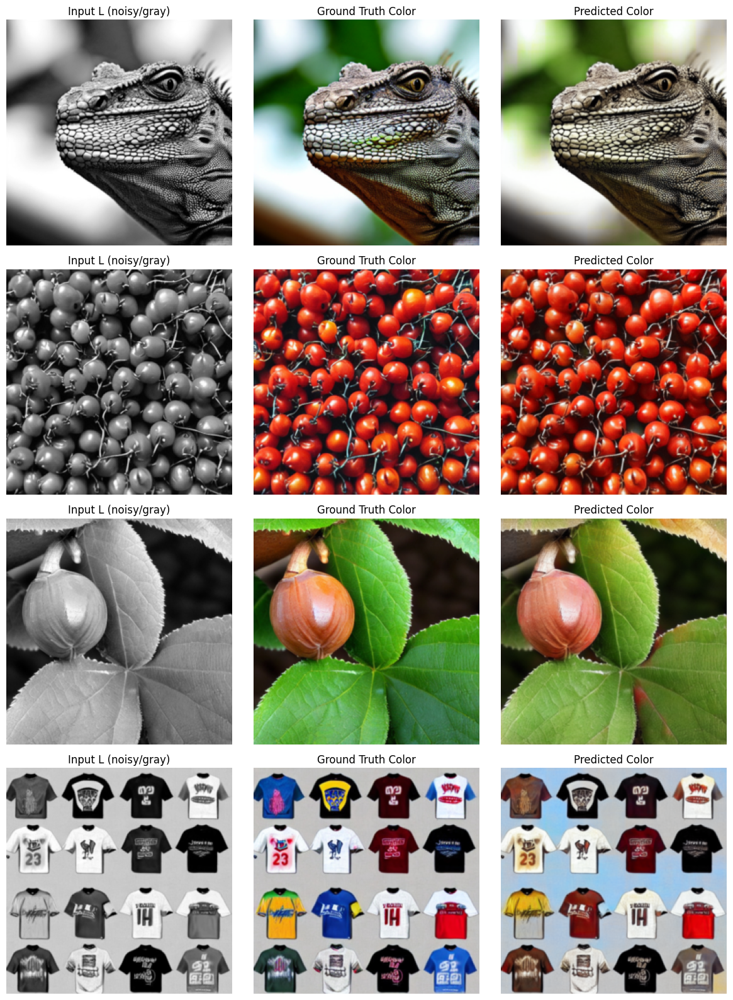

[Epoch 044] train_loss=0.0524 | val_loss=0.0614


Epoch 45 [train]:   0%|          | 0/1406 [00:00<?, ?it/s]

Epoch 45 [val]:   0%|          | 0/157 [00:00<?, ?it/s]

[Epoch 045] train_loss=0.0521 | val_loss=0.0581
  -> New best model saved at /kaggle/working/checkpoints/colorization_sdae_unet_best.pth


Epoch 46 [train]:   0%|          | 0/1406 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a73cc22d440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a73cc22d440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 46 [val]:   0%|          | 0/157 [00:00<?, ?it/s]

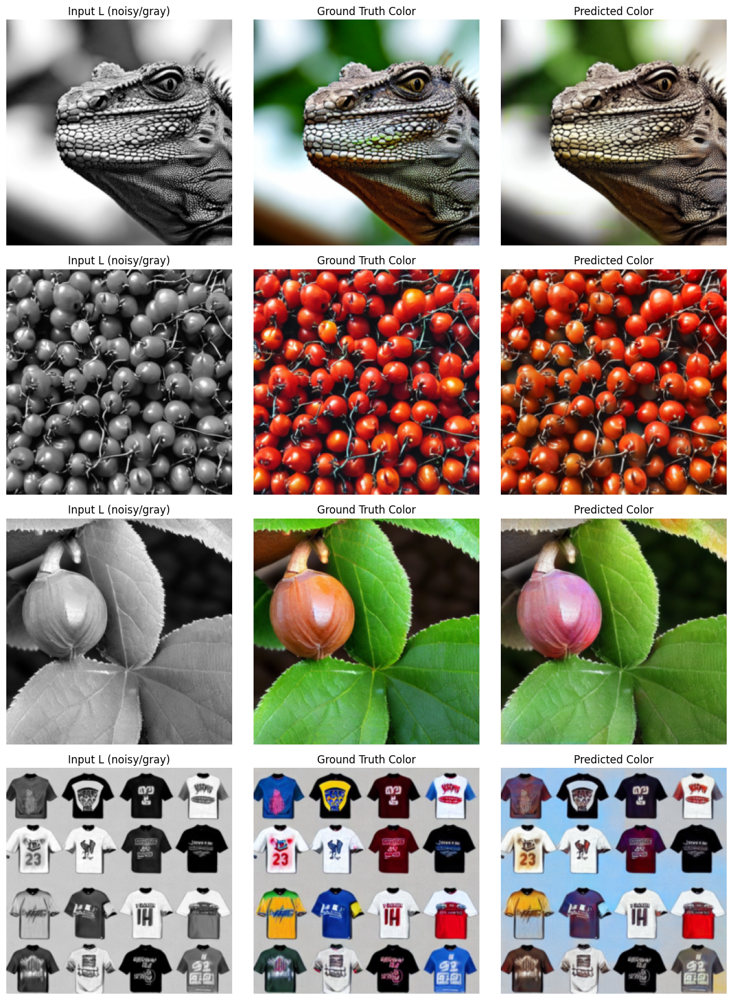

[Epoch 046] train_loss=0.0519 | val_loss=0.0597


Epoch 47 [train]:   0%|          | 0/1406 [00:00<?, ?it/s]

Epoch 47 [val]:   0%|          | 0/157 [00:00<?, ?it/s]

[Epoch 047] train_loss=0.0516 | val_loss=0.0610


Epoch 48 [train]:   0%|          | 0/1406 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a73cc22d440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a73cc22d440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 48 [val]:   0%|          | 0/157 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a73cc22d440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    Exception ignored in: self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x7a73cc22d440>

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
      File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
if w.is_alive():    self._shutdown_workers()

   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():  
       ^^^^ ^^ ^ ^ ^^^^^^^^^
^^^  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^^

  File "/usr/lib/python

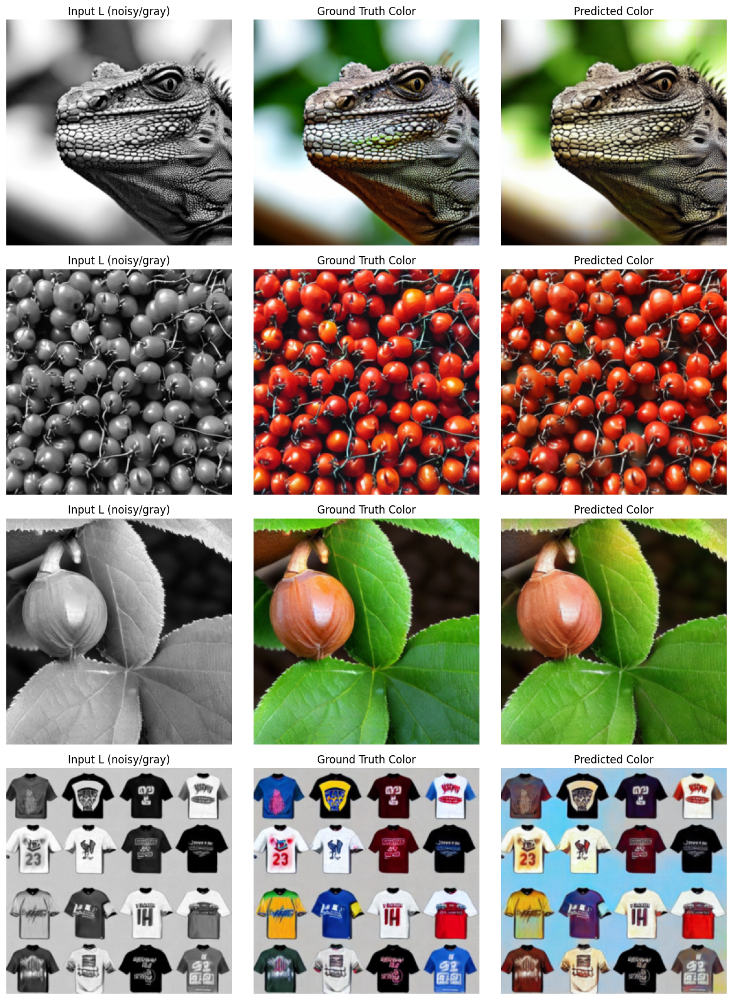

[Epoch 048] train_loss=0.0513 | val_loss=0.0707


Epoch 49 [train]:   0%|          | 0/1406 [00:00<?, ?it/s]

Epoch 49 [val]:   0%|          | 0/157 [00:00<?, ?it/s]

[Epoch 049] train_loss=0.0510 | val_loss=0.0585


Epoch 50 [train]:   0%|          | 0/1406 [00:00<?, ?it/s]

Epoch 50 [val]:   0%|          | 0/157 [00:00<?, ?it/s]

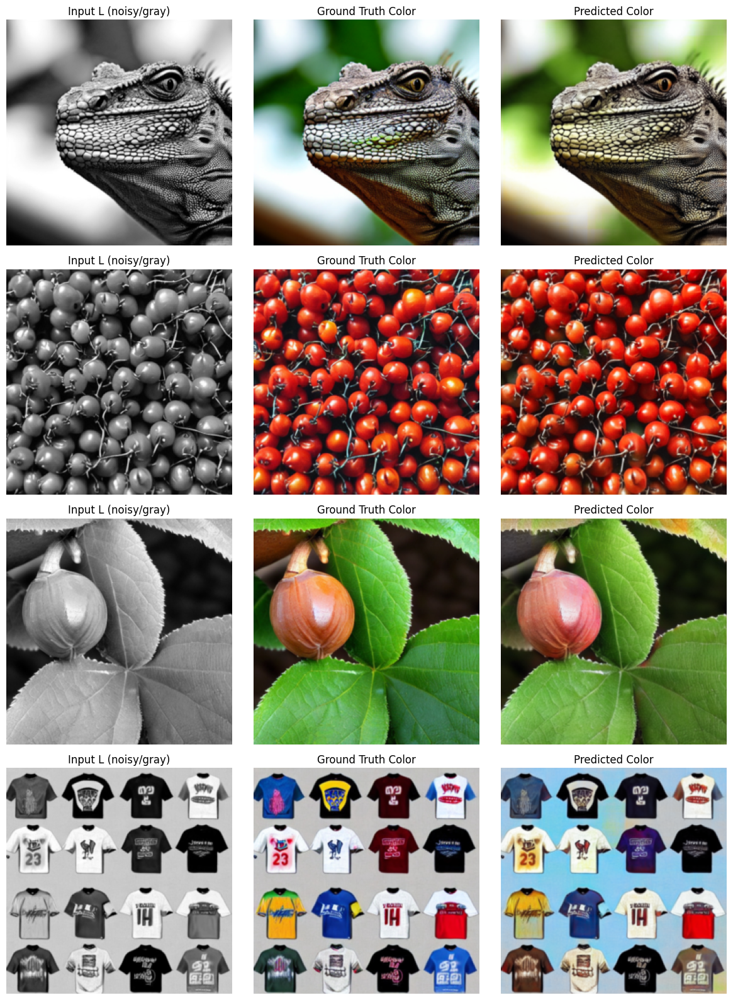

[Epoch 050] train_loss=0.0508 | val_loss=0.0614


In [16]:
best_val_loss = float("inf")
history = {
    "train_loss": [],
    "val_loss": [],
}

import os

start_epoch = 1
ckpt_working = cfg.CHECKPOINT_DIR / cfg.CKPT_NAME
ckpt_input = cfg.CHECKPOINT_DIR2 / cfg.CKPT_NAME

ckpt = None
if ckpt_working.exists():
    print(f"Found checkpoint: {ckpt_working}")
    ckpt = torch.load(ckpt_working, map_location=cfg.DEVICE, weights_only=False)
elif ckpt_input.exists():
    print(f"Found checkpoint: {ckpt_input}")
    ckpt = torch.load(ckpt_input, map_location=cfg.DEVICE, weights_only=False)

if ckpt is not None:
    if isinstance(ckpt, dict) and "model_state" in ckpt:
        model.load_state_dict(ckpt["model_state"])
        if "optimizer_state" in ckpt and ckpt["optimizer_state"] is not None:
            try:
                optimizer.load_state_dict(ckpt["optimizer_state"])
            except Exception as e:
                print("Warning: could not fully load optimizer state:", e)

        # restore history if present
        if "history" in ckpt and isinstance(ckpt["history"], dict):
            history = ckpt["history"]

        # recompute best_val_loss from history if available
        if history.get("val_loss"):
            try:
                best_val_loss = min(history["val_loss"])
            except Exception as e:
                print("Warning: could not recompute best_val_loss from history:", e)

        # resume epoch: previous epoch + 1
        if "epoch" in ckpt:
            start_epoch = ckpt["epoch"] + 1

        print(f"Resuming from epoch {start_epoch}/{cfg.NUM_EPOCHS}")
    else:
        # legacy: plain state_dict
        model.load_state_dict(ckpt)
        print("Loaded weights only (legacy checkpoint).")
else:
    print("No checkpoint found. Training from scratch.")

print(f"Training will run from epoch {start_epoch} to {cfg.NUM_EPOCHS} (inclusive).")

for epoch in range(start_epoch, cfg.NUM_EPOCHS + 1):
    train_loss = train_one_epoch(epoch, model, train_loader, optimizer, scaler, cfg.DEVICE)
    val_loss = validate(epoch, model, val_loader, cfg.DEVICE, visualize=(epoch % 2 == 0))
    
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    
    print(f"[Epoch {epoch:03d}] train_loss={train_loss:.4f} | val_loss={val_loss:.4f}")
    
    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        ckpt_path = cfg.CHECKPOINT_DIR / cfg.CKPT_NAME

        # --- FAILSAFE: Ensure directory exists before saving ---
        ckpt_path.parent.mkdir(parents=True, exist_ok=True)

        torch.save(
            {
                "epoch": epoch,
                "model_state": model.state_dict(),
                "optimizer_state": optimizer.state_dict(),
                "cfg": cfg.__dict__,
                "history": history,
            },
            ckpt_path,
        )
        print(f"  -> New best model saved at {ckpt_path}")

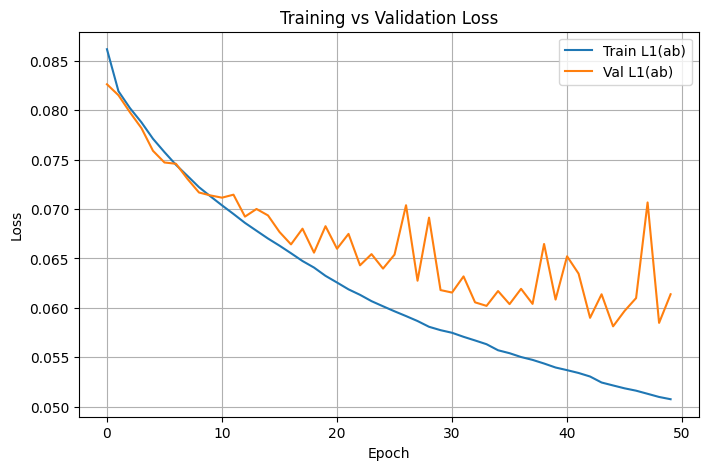

In [17]:
plt.figure(figsize=(8, 5))
plt.plot(history["train_loss"], label="Train L1(ab)")
plt.plot(history["val_loss"], label="Val L1(ab)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

# Visualize the Colourized Images 

In [18]:
import numpy as np
import cv2
import torch

def lab_denormalize(L: torch.Tensor, ab: torch.Tensor):
    """
    Convert normalized Lab (L in [-1,1], ab in [-1,1]) back to RGB [0,1] for visualization.

    L:  [B,1,H,W]
    ab: [B,2,H,W]
    Returns:
        rgb: [B,H,W,3] float32 in [0,1]
    """
    L_np = L.detach().cpu().numpy()
    ab_np = ab.detach().cpu().numpy()

    # De-normalize to OpenCV Lab float ranges
    # L in [0,100], a,b in roughly [-128,128]
    L_denorm = (L_np + 1.0) * 50.0       # [-1,1] -> [0,100]
    ab_denorm = ab_np * 128.0            # [-1,1] -> ~[-128,128]

    lab = np.concatenate([L_denorm, ab_denorm], axis=1)   # [B,3,H,W]
    lab = np.transpose(lab, (0, 2, 3, 1))                 # [B,H,W,3]

    rgbs = []
    for i in range(lab.shape[0]):
        lab_i = lab[i].astype(np.float32)
        rgb_i = cv2.cvtColor(lab_i, cv2.COLOR_LAB2RGB)    # returns float32 in [0,1]
        rgb_i = np.clip(rgb_i, 0.0, 1.0)
        rgbs.append(rgb_i)

    return np.stack(rgbs, axis=0)

RGB GT min / max: 0.0 1.0


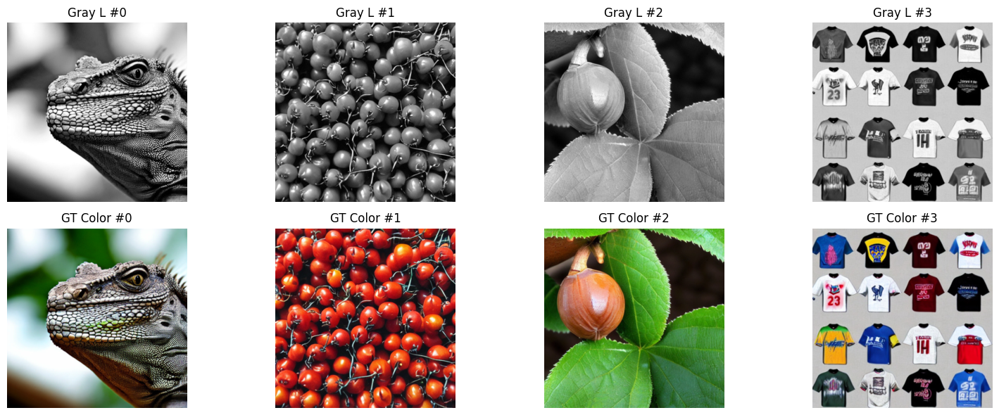

In [19]:
import matplotlib.pyplot as plt

# Grab one validation batch
L_noisy, ab, L_clean = next(iter(val_loader))

# Use clean L for visualization
L_vis = L_clean[:4]
ab_vis = ab[:4]

rgb_gt = lab_denormalize(L_vis, ab_vis)

print("RGB GT min / max:", rgb_gt.min(), rgb_gt.max())

# Plot a few examples
n = min(4, rgb_gt.shape[0])
fig, axes = plt.subplots(nrows=2, ncols=n, figsize=(4*n, 6))

for i in range(n):
    # Row 0: grayscale L
    axes[0, i].imshow(((L_vis[i, 0].cpu().numpy() + 1.0) / 2.0), cmap="gray")
    axes[0, i].set_title(f"Gray L #{i}")
    axes[0, i].axis("off")

    # Row 1: ground truth color
    axes[1, i].imshow(rgb_gt[i])
    axes[1, i].set_title(f"GT Color #{i}")
    axes[1, i].axis("off")

plt.tight_layout()
plt.show()

In [20]:
# ---- Allowlist PosixPath for safe PyTorch loading (Option A) ----
import torch
import pathlib

# Try to use the recommended safe context manager (if your torch version supports it)
try:
    safe_ctx = torch.serialization.safe_globals([pathlib.PosixPath])
    USE_SAFE_CX = True
    print("Using torch.serialization.safe_globals context manager to allow PosixPath.")
except AttributeError:
    # Fallback if context manager is not available
    torch.serialization.add_safe_globals([pathlib.PosixPath])
    USE_SAFE_CX = False
    print("safe_globals context manager not found, using add_safe_globals fallback.")

Using torch.serialization.safe_globals context manager to allow PosixPath.


In [21]:
# import torch

# # Reload best checkpoint
# ckpt_path = cfg.CHECKPOINT_DIR2 / cfg.CKPT_NAME
# print("Loading checkpoint from:", ckpt_path)

# ckpt = torch.load(ckpt_path, map_location=cfg.DEVICE)

# # Recreate model if needed (or reuse existing)
# model = ColorizationSDAEUNet(in_ch=1, out_ch=2, base_ch=64).to(cfg.DEVICE)
# model.load_state_dict(ckpt["model_state"])
# model.eval()

# # Get a small validation batch
# L_noisy, ab, L_clean = next(iter(val_loader))
# L_noisy = L_noisy.to(cfg.DEVICE)
# ab = ab.to(cfg.DEVICE)

# with torch.no_grad(), torch.amp.autocast("cuda", enabled=cfg.USE_AMP and cfg.DEVICE=="cuda"):
#     ab_pred = model(L_noisy)

# # Move back to CPU
# L_noisy_cpu = L_noisy.cpu()
# ab_cpu = ab.cpu()
# ab_pred_cpu = ab_pred.cpu()

# # Convert both GT and predicted to RGB for visualization
# rgb_gt = lab_denormalize(L_noisy_cpu[:4], ab_cpu[:4])
# rgb_pred = lab_denormalize(L_noisy_cpu[:4], ab_pred_cpu[:4])

# # Plot
# n = min(4, L_noisy_cpu.size(0))
# fig, axes = plt.subplots(nrows=n, ncols=3, figsize=(12, 4*n))

# if n == 1:
#     axes = axes.reshape(1, -1)

# for i in range(n):
#     # Column 1: Input gray
#     gray = (L_noisy_cpu[i, 0].numpy() + 1.0) / 2.0
#     axes[i, 0].imshow(gray, cmap="gray")
#     axes[i, 0].set_title("Input L (noisy/gray)")
#     axes[i, 0].axis("off")

#     # Column 2: Ground truth color
#     axes[i, 1].imshow(rgb_gt[i])
#     axes[i, 1].set_title("Ground Truth Color")
#     axes[i, 1].axis("off")

#     # Column 3: Predicted color
#     axes[i, 2].imshow(rgb_pred[i])
#     axes[i, 2].set_title("Predicted Color")
#     axes[i, 2].axis("off")

# plt.tight_layout()
# plt.show()

In [22]:
import torch, pathlib, types, sys

ckpt_path = cfg.CHECKPOINT_DIR / cfg.CKPT_NAME
print("Loading checkpoint from:", ckpt_path)

# Helper: recursive sanitizer to convert pathlib.Path -> str inside dicts/lists/tuples
def sanitize_obj(o):
    if isinstance(o, pathlib.Path):
        return str(o)
    if isinstance(o, dict):
        return {k: sanitize_obj(v) for k, v in o.items()}
    if isinstance(o, list):
        return [sanitize_obj(v) for v in o]
    if isinstance(o, tuple):
        return tuple(sanitize_obj(v) for v in o)
    return o

ckpt = None
# Try preferred safe context manager
try:
    safe_ctx = torch.serialization.safe_globals([pathlib.PosixPath])
    with safe_ctx:
        ckpt = torch.load(ckpt_path, map_location=cfg.DEVICE)
    print("Loaded checkpoint using safe_globals context manager.")
except AttributeError:
    # safe_globals context manager not available — try add_safe_globals fallback
    try:
        torch.serialization.add_safe_globals([pathlib.PosixPath])
        ckpt = torch.load(ckpt_path, map_location=cfg.DEVICE)
        print("Loaded checkpoint using add_safe_globals fallback.")
    except Exception as e:
        # Last resort: try weights_only=False if you trust the file (more risky)
        print("add_safe_globals failed or not available. As a last resort attempting weights_only=False (UNSAFE).")
        ckpt = torch.load(ckpt_path, map_location=cfg.DEVICE, weights_only=False)
        print("Loaded checkpoint with weights_only=False. Be sure you trust this file.")
except Exception as e:
    # If we reach here, try the weights_only=False route (if not already attempted)
    print("Primary safe attempt failed with exception:", repr(e))
    print("Attempting to load with weights_only=False (UNSAFE).")
    ckpt = torch.load(ckpt_path, map_location=cfg.DEVICE, weights_only=False)
    print("Loaded checkpoint with weights_only=False. Be sure you trust this file.")

# If load still failed, this will raise. Otherwise sanitize & re-save
if ckpt is None:
    raise RuntimeError("Checkpoint load failed for unknown reason.")

# Sanitize cfg (and nested structures) by converting pathlib.Path -> str to avoid future allowlist issues
sanitized = False
if "cfg" in ckpt and isinstance(ckpt["cfg"], dict):
    ckpt["cfg"] = sanitize_obj(ckpt["cfg"])
    sanitized = True

# Optionally sanitize top-level strings that are pathlib.Path objects (rare)
for k, v in list(ckpt.items()):
    if isinstance(v, pathlib.Path):
        ckpt[k] = str(v)
        sanitized = True
    elif isinstance(v, dict):
        ckpt[k] = sanitize_obj(v)  # safe to reassign

# Re-save a sanitized copy so future loads succeed without allowlisting
if sanitized:
    safe_path = ckpt_path.with_name(ckpt_path.stem + ".sanitized" + ckpt_path.suffix)
    try:
        # ensure target dir exists
        safe_path.parent.mkdir(parents=True, exist_ok=True)
        torch.save(ckpt, safe_path)
        print("Sanitized checkpoint saved to:", safe_path)
    except Exception as e:
        print("Warning: could not save sanitized checkpoint:", e)

print("Checkpoint load complete. `ckpt` is available in the notebook.")


Loading checkpoint from: /kaggle/working/checkpoints/colorization_sdae_unet_best.pth
Loaded checkpoint using safe_globals context manager.
Sanitized checkpoint saved to: /kaggle/working/checkpoints/colorization_sdae_unet_best.sanitized.pth
Checkpoint load complete. `ckpt` is available in the notebook.


In [23]:
# # --- Extract one validation batch for inspection ---
# model.eval()

# with torch.no_grad():
#     for imgs_l, imgs_ab in val_loader:
#         imgs_l = imgs_l.to(cfg.DEVICE)
#         imgs_ab = imgs_ab.to(cfg.DEVICE)

#         preds_ab = model(imgs_l)

#         # Move tensors to CPU for printing/visualization
#         ab_cpu = imgs_ab.cpu()
#         ab_pred_cpu = preds_ab.cpu()

#         print("Fetched one validation batch.")
#         break


In [24]:
# Robust: extract one validation batch and produce ab_cpu & ab_pred_cpu for inspection
import torch

model.eval()
ab_cpu = None
ab_pred_cpu = None

with torch.no_grad():
    try:
        batch = next(iter(val_loader))
    except Exception as e:
        # fallback: iterate once
        batch = None
        for b in val_loader:
            batch = b
            break
    if batch is None:
        raise RuntimeError("Could not fetch any batch from val_loader. Is val_loader empty?")

    # If batch is a dict / mapping
    if isinstance(batch, dict):
        # Try common key names
        possible_L_keys = ["l", "L", "gray", "input_l", "img_l", "image_l"]
        possible_ab_keys = ["ab", "AB", "ab_gt", "image_ab", "img_ab"]
        imgs_l = None
        imgs_ab = None
        for k in possible_L_keys:
            if k in batch:
                imgs_l = batch[k]; break
        for k in possible_ab_keys:
            if k in batch:
                imgs_ab = batch[k]; break
        # fallback: look for first tensor with channel 1 and first with channel 2
        if imgs_l is None or imgs_ab is None:
            tensors = [v for v in batch.values() if torch.is_tensor(v)]
            # choose by channel dimension if possible
            l_candidates = [t for t in tensors if t.ndim >= 2 and t.shape[1] in (1,)]
            ab_candidates = [t for t in tensors if t.ndim >= 2 and t.shape[1] in (2,)]
            if imgs_l is None and l_candidates:
                imgs_l = l_candidates[0]
            if imgs_ab is None and ab_candidates:
                imgs_ab = ab_candidates[0]
            # final fallback: pick first two tensors
            if (imgs_l is None or imgs_ab is None) and len(tensors) >= 2:
                imgs_l, imgs_ab = tensors[0], tensors[1]
    # If batch is tuple/list
    elif isinstance(batch, (list, tuple)):
        elems = list(batch)
        tensors = [e for e in elems if torch.is_tensor(e)]
        # Common patterns:
        # (imgs_l, imgs_ab)
        # (inputs, targets) where targets may be class labels (not suitable)
        # (imgs, labels, paths)
        imgs_l = imgs_ab = None
        if len(elems) == 2 and all(torch.is_tensor(e) for e in elems):
            imgs_l, imgs_ab = elems[0], elems[1]
        else:
            # prefer first tensor with channel==1 for L and channel==2 for ab
            l_candidates = [t for t in tensors if t.ndim >= 2 and t.shape[1] in (1,)]
            ab_candidates = [t for t in tensors if t.ndim >= 2 and t.shape[1] in (2,)]
            if l_candidates:
                imgs_l = l_candidates[0]
            if ab_candidates:
                imgs_ab = ab_candidates[0]
            # if still none, pick first two tensors (best-effort)
            if (imgs_l is None or imgs_ab is None) and len(tensors) >= 2:
                imgs_l = imgs_l or tensors[0]
                imgs_ab = imgs_ab or tensors[1]
    else:
        raise RuntimeError(f"Unhandled batch type: {type(batch)}")

    # Final sanity checks
    if not torch.is_tensor(imgs_l):
        raise RuntimeError("Could not find L-channel tensor in the batch. Batch keys/structure unusual.")
    if not torch.is_tensor(imgs_ab):
        # If imgs_ab is actually integer labels (not ab channels), warn and stop
        if imgs_ab is None:
            raise RuntimeError("Could not find ab-channel tensor in the batch. Are you using a colorization dataset?")
        else:
            # If it's 1-D labels, it's not usable for ab comparison
            if imgs_ab.ndim == 1:
                raise RuntimeError("Second tensor looks like class labels (1-D). The dataset may not supply ab channels.")
            # else proceed if it's a tensor but has unexpected shape
    # Move to device and run model
    imgs_l = imgs_l.to(cfg.DEVICE)
    imgs_ab = imgs_ab.to(cfg.DEVICE)

    # If imgs_l has 3 channels instead of single L, try to extract L channel heuristically:
    if imgs_l.ndim == 4 and imgs_l.shape[1] == 3:
        # assume RGB input; convert to luminance approx: L = 0.2989 R + 0.5870 G + 0.1140 B
        imgs_l = (0.2989 * imgs_l[:,0:1,:,:] + 0.5870 * imgs_l[:,1:2,:,:] + 0.1140 * imgs_l[:,2:3,:,:])

    preds_ab = model(imgs_l)  # model expected to output ab channels or similar

    # Move to CPU for inspection
    ab_cpu = imgs_ab.detach().cpu()
    ab_pred_cpu = preds_ab.detach().cpu()

    print("Extraction succeeded.")
    print("ab_cpu shape:", ab_cpu.shape)
    print("ab_pred_cpu shape:", ab_pred_cpu.shape)
    print("GT ab   min/max:", ab_cpu.min().item(), ab_cpu.max().item())
    print("Pred ab min/max:", ab_pred_cpu.min().item(), ab_pred_cpu.max().item())


Extraction succeeded.
ab_cpu shape: torch.Size([64, 2, 256, 256])
ab_pred_cpu shape: torch.Size([64, 2, 256, 256])
GT ab   min/max: -0.759521484375 0.735595703125
Pred ab min/max: -0.8037879467010498 0.6603385806083679


In [25]:
# print("GT ab   min/max:", ab_cpu.min().item(), ab_cpu.max().item())
# print("Pred ab min/max:", ab_pred_cpu.min().item(), ab_pred_cpu.max().item())

# # Check L1 loss on this batch (should be similar to your val_loss)
# batch_l1 = torch.mean(torch.abs(ab_pred_cpu - ab_cpu)).item()
# print("Batch L1(ab) loss:", batch_l1)

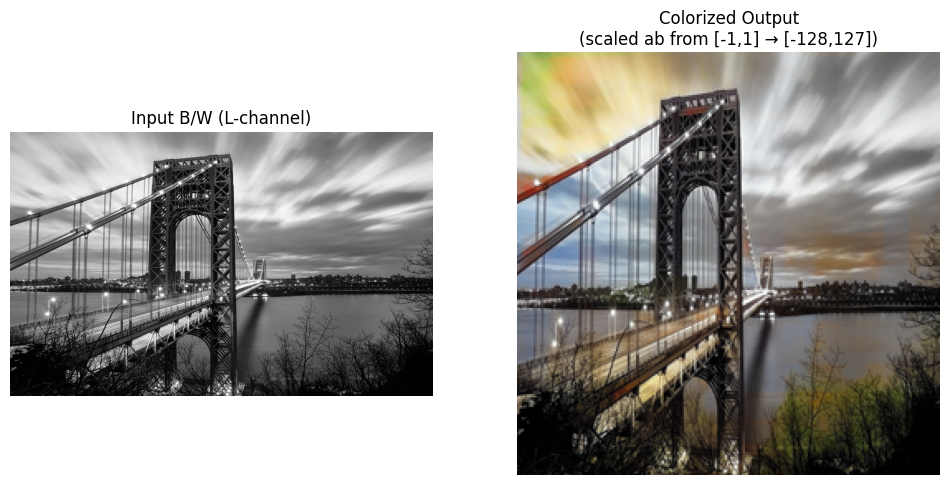

Colorized image saved to: /kaggle/working/colorized_output.png


In [26]:
# =====================================================================
# FINAL CELL: COLORIZE YOUR OWN B/W IMAGE
# =====================================================================

import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage import color
from pathlib import Path

# -----------------------------
# USER: SET YOUR INPUT IMAGE HERE
# -----------------------------
INPUT_IMAGE_PATH = "/kaggle/input/bw-test/LondonBridge.jpeg"   # <-- CHANGE THIS
OUTPUT_IMAGE_PATH = "/kaggle/working/colorized_output.png"

# -----------------------------
# Load + preprocess image (expects grayscale or RGB)
# -----------------------------
img_path = Path(INPUT_IMAGE_PATH)
if not img_path.exists():
    raise FileNotFoundError(f"Image not found: {img_path}")

pil = Image.open(str(img_path)).convert("RGB")

# Resize to model size
TGT = int(cfg.IMAGE_SIZE)
pil_resized = pil.resize((TGT, TGT), Image.LANCZOS)

# Convert to LAB
rgb = np.asarray(pil_resized) / 255.0
lab = color.rgb2lab(rgb).astype(np.float32)

L = lab[..., 0:1]            # (H,W,1), range [0,100]
ab_gt = lab[..., 1:3]        # not needed, but useful for debug

# Prepare tensor for model: normalize L → [-1,1]
L_tensor = torch.from_numpy(L).permute(2,0,1).unsqueeze(0)  # (1,1,H,W)
L_tensor = ((L_tensor / 100.0) * 2.0 - 1.0).to(cfg.DEVICE)

# -----------------------------
# Model inference
# -----------------------------
model.eval()
with torch.no_grad():
    pred_ab = model(L_tensor)     # expect (1,2,H,W)
    pred_ab = pred_ab[:, :2, :, :]   # safety
    pred_ab_cpu = pred_ab.cpu().numpy()[0].transpose(1,2,0)   # (H,W,2)

# -----------------------------
# Convert model output back to LAB scale
# Most ab predictions are in [-1,1]; scale → [-128,127]
# -----------------------------
pmin, pmax = pred_ab_cpu.min(), pred_ab_cpu.max()
if pmin >= -1.1 and pmax <= 1.1:
    # assume normalized ab
    ab_pred_lab = pred_ab_cpu * 128.0
    scale_reason = "scaled ab from [-1,1] → [-128,127]"
else:
    ab_pred_lab = pred_ab_cpu
    scale_reason = "ab looks already in LAB range (no scaling applied)"

# -----------------------------
# Reconstruct LAB → RGB
# -----------------------------
L_recon = ((L_tensor.cpu().numpy()[0,0] + 1.0) / 2.0) * 100.0
lab_out = np.concatenate([L_recon[...,None], ab_pred_lab], axis=2)
rgb_out = color.lab2rgb(lab_out)
rgb_out = np.clip(rgb_out, 0, 1)
rgb_uint8 = (rgb_out * 255).astype(np.uint8)
out_pil = Image.fromarray(rgb_uint8)

# Save final output
Path(OUTPUT_IMAGE_PATH).parent.mkdir(parents=True, exist_ok=True)
out_pil.save(OUTPUT_IMAGE_PATH)

# -----------------------------
# Display result
# -----------------------------
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(pil.convert("L"), cmap="gray")
plt.title("Input B/W (L-channel)")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(out_pil)
plt.title(f"Colorized Output\n({scale_reason})")
plt.axis("off")

plt.show()

print("Colorized image saved to:", OUTPUT_IMAGE_PATH)

Model forward failed for input L_neg1_1/L_rep3: Given groups=1, weight of size [64, 1, 3, 3], expected input[1, 3, 256, 256] to have 1 channels, but got 3 channels instead
Model forward failed for input L_neg1_1/RGB_raw: Given groups=1, weight of size [64, 1, 3, 3], expected input[1, 3, 256, 256] to have 1 channels, but got 3 channels instead
Model forward failed for input L_0_1/L_rep3: Given groups=1, weight of size [64, 1, 3, 3], expected input[1, 3, 256, 256] to have 1 channels, but got 3 channels instead
Model forward failed for input L_0_1/RGB_raw: Given groups=1, weight of size [64, 1, 3, 3], expected input[1, 3, 256, 256] to have 1 channels, but got 3 channels instead


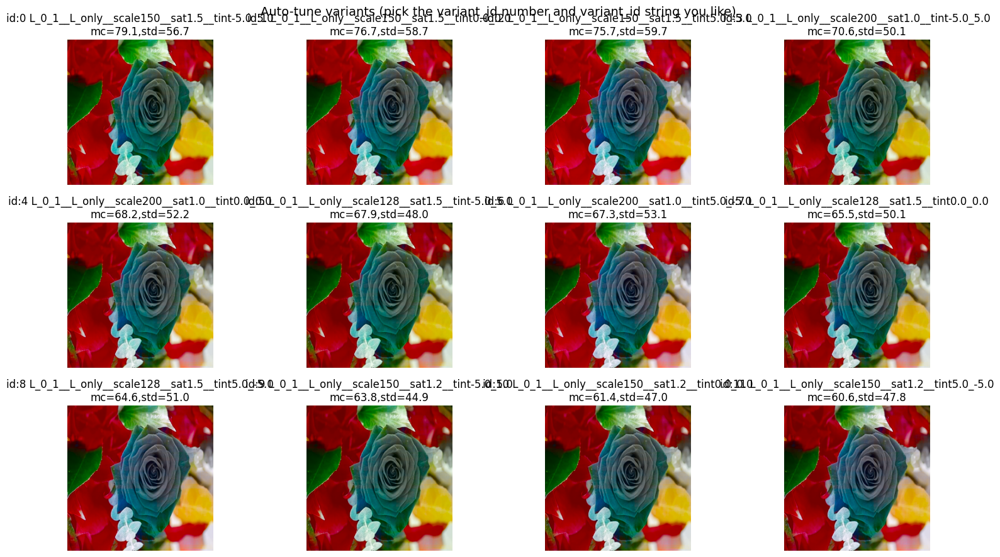

Saved top variant images to: /kaggle/working/colorized_variants_full

Top candidates (printed):
0 L_0_1__L_only__scale150__sat1.5__tint-5.0_5.0 mean_chroma= 79.06 raw_min/max= -0.378/0.671
1 L_0_1__L_only__scale150__sat1.5__tint0.0_0.0 mean_chroma= 76.73 raw_min/max= -0.378/0.671
2 L_0_1__L_only__scale150__sat1.5__tint5.0_-5.0 mean_chroma= 75.74 raw_min/max= -0.378/0.671
3 L_0_1__L_only__scale200__sat1.0__tint-5.0_5.0 mean_chroma= 70.59 raw_min/max= -0.378/0.671
4 L_0_1__L_only__scale200__sat1.0__tint0.0_0.0 mean_chroma= 68.20 raw_min/max= -0.378/0.671
5 L_0_1__L_only__scale128__sat1.5__tint-5.0_5.0 mean_chroma= 67.88 raw_min/max= -0.378/0.671
6 L_0_1__L_only__scale200__sat1.0__tint5.0_-5.0 mean_chroma= 67.32 raw_min/max= -0.378/0.671
7 L_0_1__L_only__scale128__sat1.5__tint0.0_0.0 mean_chroma= 65.47 raw_min/max= -0.378/0.671
8 L_0_1__L_only__scale128__sat1.5__tint5.0_-5.0 mean_chroma= 64.63 raw_min/max= -0.378/0.671
9 L_0_1__L_only__scale150__sat1.2__tint-5.0_5.0 mean_chroma= 63.81 raw

In [27]:
# =====================================================================
# AUTO-TUNE: try multiple preprocessing / ab-scaling / saturation boosts
# Paste at notebook end (after model is loaded). Then pick the variant_id you like.
# =====================================================================
import torch, numpy as np
from PIL import Image
from skimage import color
import matplotlib.pyplot as plt
from pathlib import Path
import math

# --------- USER: set your input path here ----------
INPUT_IMAGE = "/kaggle/input/bw-test/RoseBW.jpeg"   # <-- change
OUT_DIR = Path("/kaggle/working/colorized_variants_full")
OUT_DIR.mkdir(parents=True, exist_ok=True)
IMG_SIZE = int(cfg.IMAGE_SIZE)
device = cfg.DEVICE

# --------- load and resize ----------
p = Path(INPUT_IMAGE)
if not p.exists():
    raise FileNotFoundError(f"Image not found: {p}")
pil = Image.open(str(p)).convert("RGB")
pil = pil.resize((IMG_SIZE, IMG_SIZE), Image.LANCZOS)
rgb_np = np.asarray(pil).astype(np.float32) / 255.0
lab_np = color.rgb2lab(rgb_np).astype(np.float32)
L_np = lab_np[..., 0:1]   # L in [0,100]

# --------- helper to run model given an L_tensor or RGB tensor ----------
def run_model_with_input(inp_tensor):
    model.eval()
    with torch.no_grad():
        out = model(inp_tensor.to(device))
    return out.detach().cpu().numpy()

# --------- candidate input normalizations to try ----------
norm_modes = [
    ("L_neg1_1", lambda L: ((L / 100.0) * 2.0 - 1.0)),   # L in [-1,1]
    ("L_0_1",    lambda L: (L / 100.0)),                # L in [0,1]
]

# --------- ab scale multipliers & transforms to try ----------
# typical: model outputs in [-1,1] -> multiply 128 to get ab; but try multiples around that
ab_scale_calls = [
    ("scale128", lambda ab: ab * 128.0),
    ("scale100", lambda ab: ab * 100.0),
    ("scale150", lambda ab: ab * 150.0),
    ("scale80",  lambda ab: ab * 80.0),
    ("scale255_shift", lambda ab: ab * 255.0 - 128.0),
    ("no_scale", lambda ab: ab),
    ("scale200", lambda ab: ab * 200.0),
]

# mild saturation boosts (multiply ab)
saturation_boosts = [1.0, 1.2, 1.5]

# small tint shifts (adds to a,b) to correct bluish/purplish bias if necessary
tint_shifts = [
    (0.0, 0.0),   # none
    (5.0, -5.0),  # warm-ish tweak
    (-5.0, 5.0),  # cool-ish tweak
]

# run all combinations and collect outputs
results = []
model.eval()
for norm_name, norm_fn in norm_modes:
    # prepare tensor (1,1,H,W)
    L_t = torch.from_numpy(norm_fn(L_np)).permute(2,0,1).unsqueeze(0).float()
    # send to device when running model call (done in helper)
    # if your model expects 3 channels, we also test repeating L to 3 channels below
    in_tensors = []
    # L-only
    in_tensors.append(("L_only", L_t))
    # repeated 3-channel (some models take 3ch)
    in_tensors.append(("L_rep3", L_t.repeat(1,3,1,1)))
    # also try RGB raw if model has 3 input channels (inference only; safe)
    # prepare rgb tensor
    rgb_t = torch.from_numpy(rgb_np.transpose(2,0,1)).unsqueeze(0).float()
    in_tensors.append(("RGB_raw", rgb_t))

    for in_name, inp in in_tensors:
        # attempt forward pass; skip if model fails
        try:
            out_np = run_model_with_input(inp)
        except Exception as e:
            print(f"Model forward failed for input {norm_name}/{in_name}: {e}")
            continue

        # unify to (H,W,2) for ab_raw (take first two channels)
        if out_np.ndim == 4:
            arr = out_np[0]   # (C,H,W)
        elif out_np.ndim == 3:
            arr = out_np
        else:
            print("Unexpected model output dims:", out_np.shape)
            continue
        if arr.shape[0] < 2:
            print("Model output has fewer than 2 channels:", arr.shape)
            continue
        ab_raw = arr[:2,:,:].transpose(1,2,0).copy()  # (H,W,2)

        # diagnostics of raw output
        raw_min, raw_max = float(ab_raw.min()), float(ab_raw.max())
        raw_mean_mag = float(np.mean(np.linalg.norm(ab_raw, axis=2)))

        # try different scale and post-process combos
        for scale_name, scale_fn in ab_scale_calls:
            ab_scaled = scale_fn(ab_raw.copy())
            for sat in saturation_boosts:
                if sat != 1.0:
                    ab_scaled2 = ab_scaled * sat
                else:
                    ab_scaled2 = ab_scaled.copy()
                for ts in tint_shifts:
                    ab_final = ab_scaled2 + np.array([ts[0], ts[1]])[None,None,:]

                    # build LAB and convert to RGB
                    # compute L_recon (back to 0-100) according to norm
                    if norm_name == "L_neg1_1":
                        L_recon = ((L_t.cpu().numpy()[0,0] + 1.0) / 2.0) * 100.0
                    else:
                        L_recon = (L_t.cpu().numpy()[0,0]) * 100.0

                    lab_out = np.concatenate([L_recon[...,None], ab_final], axis=2)
                    try:
                        rgb_out = color.lab2rgb(lab_out)
                    except Exception as e:
                        # skip if invalid lab ranges
                        print("lab2rgb failed:", e)
                        continue
                    rgb_out = np.clip(rgb_out,0,1)
                    # compute simple colorfulness metric: mean chroma magnitude
                    chroma = np.linalg.norm(ab_final, axis=2)
                    mean_chroma = float(chroma.mean())
                    std_chroma = float(chroma.std())
                    # store
                    vid = f"{norm_name}__{in_name}__{scale_name}__sat{sat}__tint{ts[0]}_{ts[1]}"
                    results.append({
                        "variant_id": vid,
                        "norm": norm_name,
                        "in_type": in_name,
                        "scale": scale_name,
                        "sat": sat,
                        "tint": ts,
                        "mean_chroma": mean_chroma,
                        "std_chroma": std_chroma,
                        "raw_min": raw_min,
                        "raw_max": raw_max,
                        "rgb": (rgb_out*255).astype(np.uint8)
                    })

# sort results by mean_chroma (descending) but also avoid extremely high chroma (cap)
results_sorted = sorted(results, key=lambda r: r["mean_chroma"], reverse=True)

# Pick top candidates but exclude obviously insane chroma (e.g., mean > 80)
filtered = [r for r in results_sorted if r["mean_chroma"] < 80.0]
top = filtered[:12] if filtered else results_sorted[:12]

# Display grid
n = len(top)
cols = min(4, n)
rows = math.ceil(n/cols)
plt.figure(figsize=(4*cols, 3*rows))
for i, r in enumerate(top):
    plt.subplot(rows, cols, i+1)
    plt.imshow(r["rgb"])
    plt.title(f"id:{i} {r['variant_id']}\nmc={r['mean_chroma']:.1f},std={r['std_chroma']:.1f}")
    plt.axis("off")
plt.suptitle("Auto-tune variants (pick the variant_id number and variant_id string you like)", fontsize=14)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

# Save all top images individually and a combined grid
for i, r in enumerate(top):
    outp = OUT_DIR / f"variant_{i}_{r['variant_id']}.png"
    Image.fromarray(r["rgb"]).save(outp)
print("Saved top variant images to:", OUT_DIR)
print("\nTop candidates (printed):")
for i, r in enumerate(top):
    print(i, r["variant_id"], "mean_chroma=", f"{r['mean_chroma']:.2f}", "raw_min/max=", f"{r['raw_min']:.3f}/{r['raw_max']:.3f}")
